In [1]:
%load_ext autoreload
%autoreload 2

In [37]:
import arviz
import ipywidgets
from matplotlib import cm, pyplot
import numpy
import os
import pandas
import pathlib
import pickle
try:
    import pymc as pymc3
except:
    import pymc3

import calibr8
import cutisplit
import pyrff
import retl
import robotools
import scipy

import run_analysis


print(f"pymc {pymc3.__version__}")
print(f"calibr8 {calibr8.__version__}")

pymc 4.0.0b1
calibr8 6.1.2


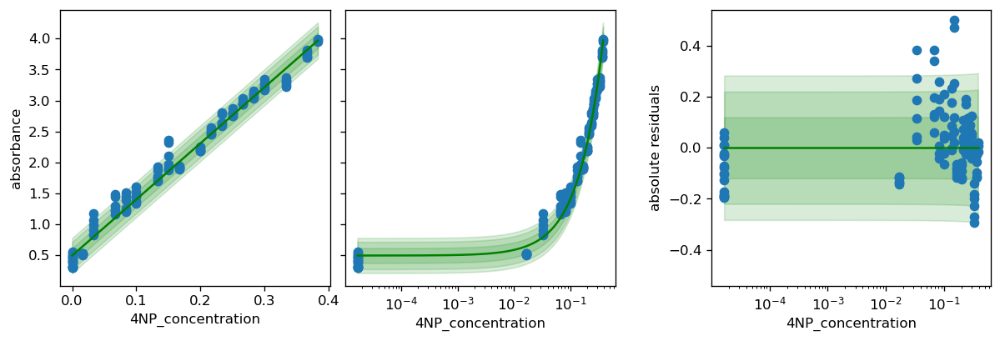

In [38]:
RUN_ID = "C3C1XZ"
resultpath = f'{RUN_ID}_Results' 
cm_nitrophenol = cutisplit.NitrophenolAbsorbanceModel.load(rf"{resultpath}\{RUN_ID}_cm_nitrophenol.json")
calibr8.plot_model(cm_nitrophenol)


df_inputs, df_kinetics = run_analysis.read_rounds(["BWA7DQ", "BZACW9", "C3C1XZ"])

## Creating the Model

In [39]:
model = cutisplit.LongFormModel(
    df_inputs,
    df_kinetics=df_kinetics,
    cm_nitrophenol=cm_nitrophenol,
)
# the shapes of the dataset are encoded in the "coords" of the underlying PyMC3 model:
model.summary()

strain              (24,)	AbnA, AmyE, AprE, …, YwmC
culture_id          (84,)	BWA7DQ_A02, BWA7DQ_A04, BWA7DQ_A05, …, C3C1XZ_F07
kinetic_id          (336,)	BWA7DQ_1_B01, BWA7DQ_1_B02, BWA7DQ_1_B03, …, C3C1XZ_2_G12
column_id           (12,)	1, 2, 3, …, 12
cutinase_cycle      (30,)	0, 1, 2, …, 29


c:\users\helleckes\repos\pymc\pymc\data.py:641: FutureWarning: The `mutable` kwarg was not specified. Currently it defaults to `pm.Data(mutable=True)`, which is equivalent to using `pm.MutableData()`. In v4.1.0 the default will change to `pm.Data(mutable=False)`, equivalent to `pm.ConstantData`. Set `pm.Data(..., mutable=False/True)`, or use `pm.ConstantData`/`pm.MutableData`.
  warnings.warn(


The PyMC3 model can be visualized as a graph:

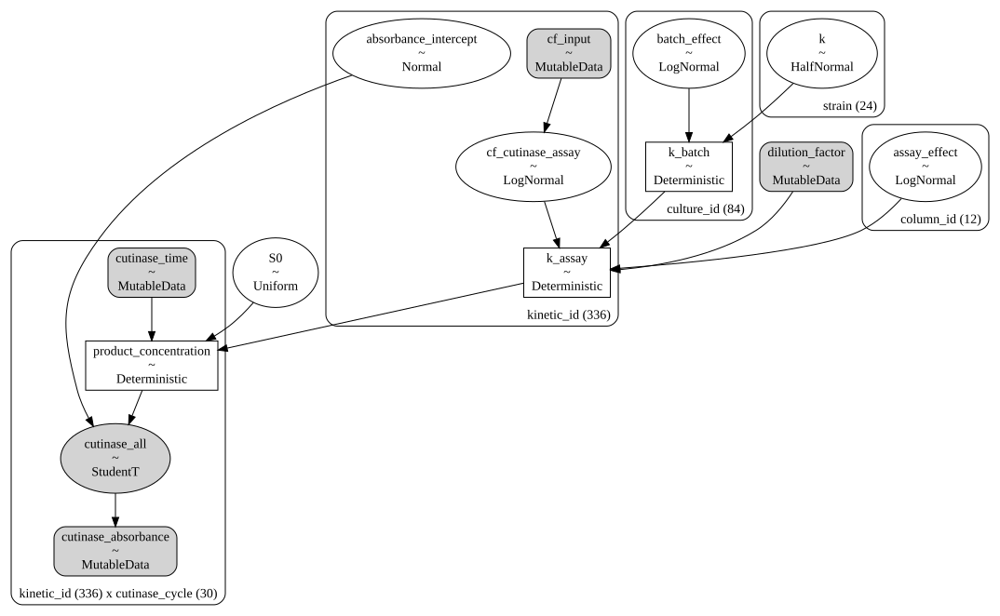

In [41]:
pymc3.model_to_graphviz(model.pmodel)

In [42]:
help(pymc3.sample)

Help on function sample in module pymc.sampling:

sample(draws=1000, step=None, init='auto', n_init=200000, initvals: Union[Dict[Union[aesara.graph.basic.Variable, str], Union[numpy.ndarray, aesara.graph.basic.Variable, str]], Sequence[Union[Dict[Union[aesara.graph.basic.Variable, str], Union[numpy.ndarray, aesara.graph.basic.Variable, str]], NoneType]], NoneType] = None, trace: Union[pymc.backends.base.BaseTrace, List[str], NoneType] = None, chain_idx=0, chains=None, cores=None, tune=1000, progressbar=True, model=None, random_seed=None, discard_tuned_samples=True, compute_convergence_checks=True, callback=None, jitter_max_retries=10, *, return_inferencedata=True, idata_kwargs: dict = None, mp_ctx=None, **kwargs) -> Union[arviz.data.inference_data.InferenceData, pymc.backends.base.MultiTrace]
    Draw samples from the posterior using the given step methods.
    
    Multiple step methods are supported via compound step methods.
    
    Parameters
    ----------
    draws : int
       

In [43]:
with model.pmodel:
    idata = pymc3.sample(return_inferencedata=True, target_accept=0.9, )
idata

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [cf_cutinase_assay, k, batch_effect, assay_effect, S0, absorbance_intercept]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 763 seconds.


Inference data with groups:
	> posterior
	> log_likelihood
	> sample_stats
	> observed_data
	> constant_data

The result should be saved such that the analysis can run in another notebook.

In [44]:
idata.to_netcdf(fr"{resultpath}\{RUN_ID}_round2_LCC30.nc")

'C3C1XZ_Results\\C3C1XZ_round2_LCC30.nc'

Execute the next cell in case you want to reload saved data

In [13]:
idata = arviz.from_netcdf(fr"{resultpath}\{RUN_ID}_round2_LCC30_Factor2.nc")

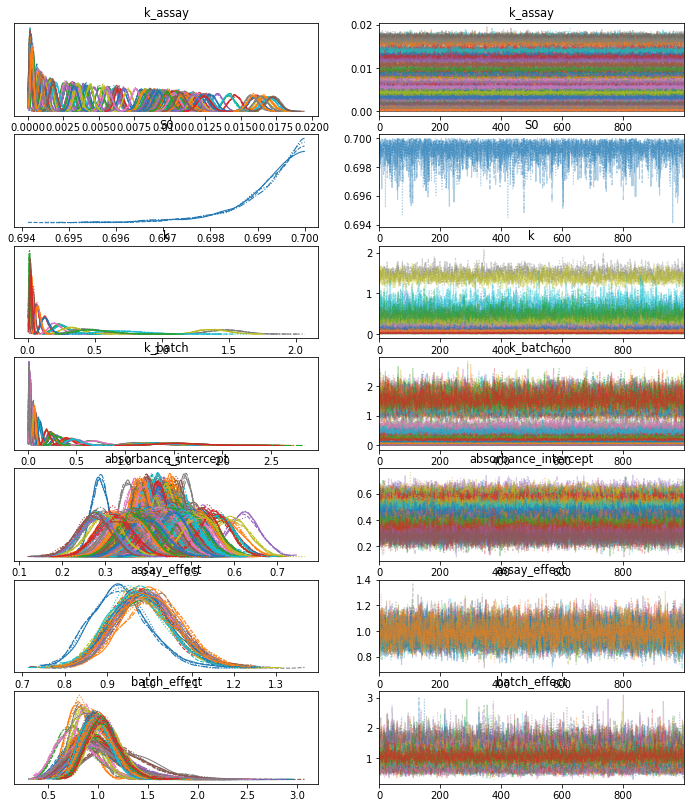

In [45]:
arviz.plot_trace(idata, var_names=[
    "k_assay", "S0", "k", "k_batch", "absorbance_intercept", "assay_effect", "batch_effect"
]);
# The left subplots show the posterior probability density.
# The right subplots show the MCMC. If they look like random noise everything is fine.
# The linestyle corresponds to independent MCMC chains - they should come to the same result.

C:\Users\helleckes\AppData\Local\Continuum\miniconda3\envs\dibecs_6.0.5\lib\site-packages\arviz\plots\backends\matplotlib\pairplot.py:238: UserWarning: rcParams['plot.max_subplots'] (144) is smaller than the number of resulting pair plots with these variables, generating only a 16x16 grid
  warnings.warn(


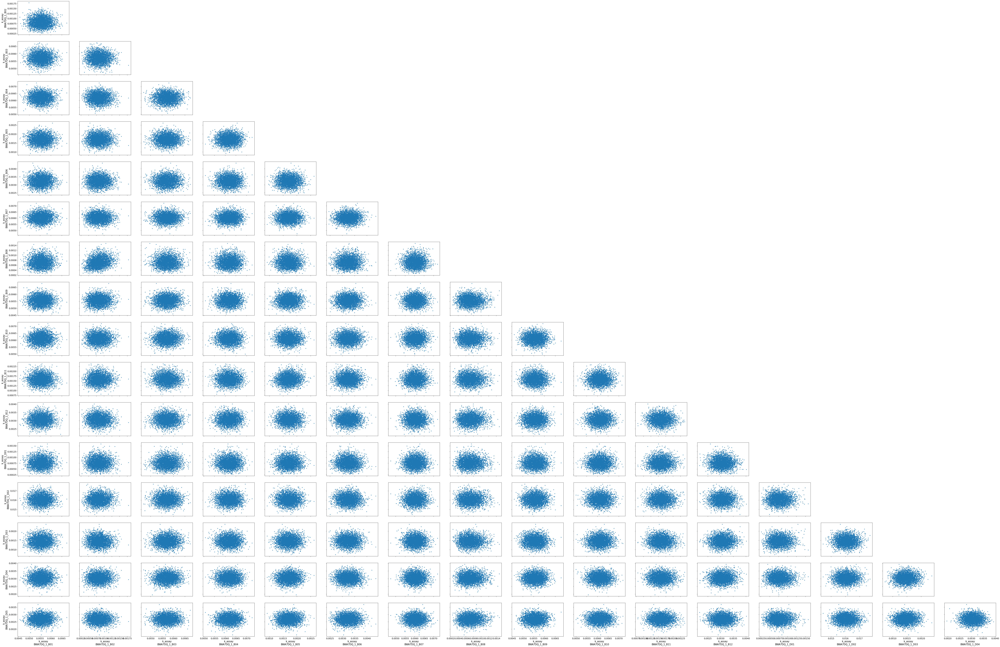

In [46]:
arviz.rcParams['plot.max_subplots'] = 144
arviz.plot_pair(idata, var_names=[
    "k_assay", 
    "k", "k_batch", "S0", 
    "absorbance_intercept"
]);

array([<AxesSubplot:title={'center':'94.0% HDI'}>], dtype=object)

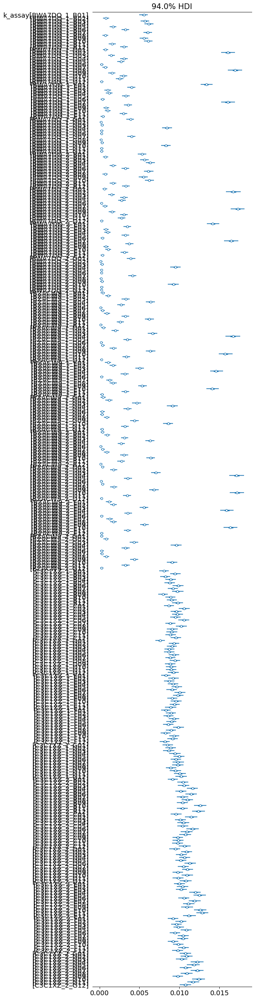

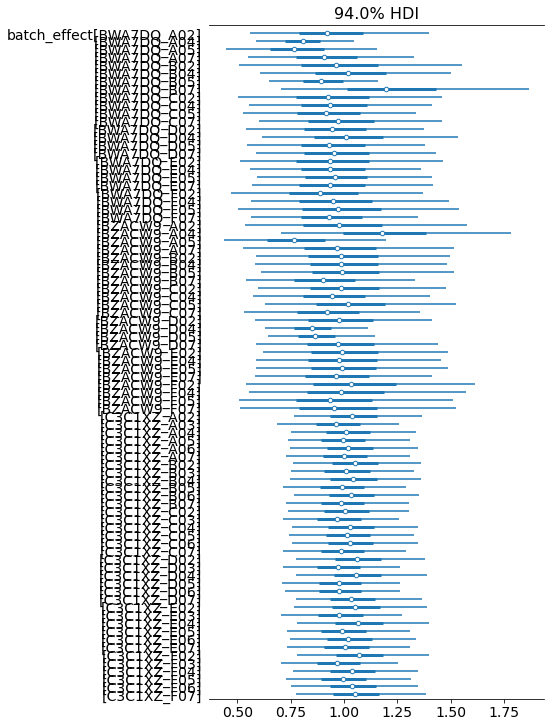

In [49]:
#arviz.plot_forest(idata, var_names=["k_batch"], combined=True)
arviz.plot_forest(idata, var_names=["k_assay"], combined=True)
arviz.plot_forest(idata, var_names=["batch_effect"], combined=True)

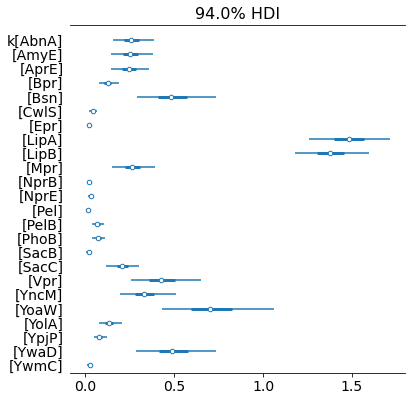

In [58]:
arviz.plot_forest(idata, var_names=["k"], combined=True)
pyplot.savefig(fr"{resultpath}\{RUN_ID}_result_round3_probsk.png")

In [51]:
posterior = idata.posterior.stack(sample=("chain", "draw"))
posterior

<xarray.Dataset>
Dimensions:                (kinetic_id: 336, sample: 4000, strain: 24, culture_id: 84, column_id: 12, cutinase_cycle: 30)
Coordinates:
  * kinetic_id             (kinetic_id) <U12 'BWA7DQ_1_B01' ... 'C3C1XZ_2_G12'
  * strain                 (strain) <U4 'AbnA' 'AmyE' 'AprE' ... 'YwaD' 'YwmC'
  * culture_id             (culture_id) <U10 'BWA7DQ_A02' ... 'C3C1XZ_F07'
  * column_id              (column_id) int32 1 2 3 4 5 6 7 8 9 10 11 12
  * cutinase_cycle         (cutinase_cycle) int32 0 1 2 3 4 5 ... 25 26 27 28 29
  * sample                 (sample) MultiIndex
  - chain                  (sample) int64 0 0 0 0 0 0 0 0 0 ... 3 3 3 3 3 3 3 3
  - draw                   (sample) int64 0 1 2 3 4 5 ... 995 996 997 998 999
Data variables:
    cf_cutinase_assay      (kinetic_id, sample) float64 0.7571 0.8596 ... 0.4739
    k                      (strain, sample) float64 0.331 0.2275 ... 0.02144
    batch_effect           (culture_id, sample) float64 0.9963 0.8624 ... 0.9836
    assay_effect           (column_id, sample) float64 0.9389 0.9307 ... 1.028
    S0                     (sample) float64 0.6999 0.6999 ... 0.6999 0.6995
    absorbance_intercept   (kinetic_id, sample) float64 0.4412 0.4229 ... 0.2535
    k_batch                (culture_id, sample) float64 0.3079 0.3101 ... 1.702
    k_assay                (kinetic_id, sample) float64 0.005419 ... 0.01086
    product_concentration  (kinetic_id, cutinase_cycle, sample) float64 0.0 ....
Attributes:
    created_at:                 2022-01-07T19:01:11.352785
    arviz_version:              0.11.4
    inference_library:          pymc
    inference_library_version:  4.0.0b1
    sampling_time:              763.4819929599762
    tuning_steps:               1000

In [52]:
strains = numpy.unique(df_inputs.strain.values)
pyrff.sample_batch(
    posterior.k.values,
    ids=strains,
    batch_size=12,
    correlated=True
)

('LipA',
 'LipA',
 'LipA',
 'LipB',
 'LipA',
 'LipA',
 'LipA',
 'LipA',
 'LipB',
 'LipA',
 'LipA',
 'LipA')

In [53]:
probs = pyrff.sampling_probabilities(
    posterior.k.values,
    correlated=True
)

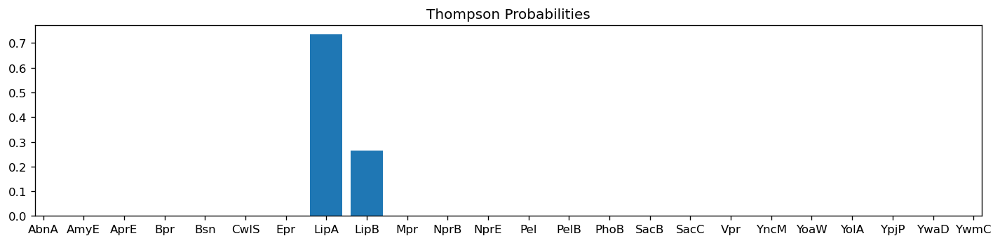

In [57]:
fig, ax = pyplot.subplots(figsize=(12,3), dpi=120)
ax.bar(x=numpy.arange(len(probs)), height=probs,)
ax.set(
    xticks=numpy.arange(len(probs)), 
    xticklabels=numpy.unique(df_inputs.strain.values),
    xlim=(-0.2,23.2),
)
ax.set_title("Thompson Probabilities")
pyplot.tight_layout()
pyplot.savefig(fr"{resultpath}\{RUN_ID}_thompson_probs.png")

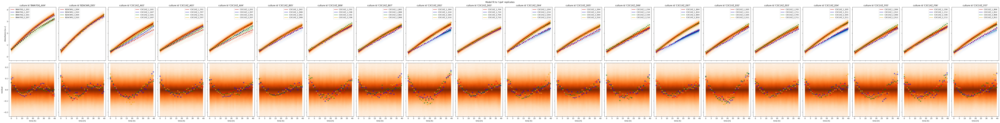

In [60]:
#for strain in posterior.strains.values:
strain="LipA"
culture_ids = df_inputs[df_inputs.strain==strain].index.to_list()
fig, axs = pyplot.subplots(
        dpi=140,
        figsize=( 4*len(culture_ids), 10),
        ncols=len(culture_ids),
        nrows=2,
        sharey="row",
        sharex="col",
        squeeze=False,
    )
for c, cid in enumerate(culture_ids):
    df = df_kinetics[df_kinetics.culture_id==cid]
    kinetic_ids = df.index
    residual_ptp = 0
    for r, (kid, (color, cmap)) in enumerate(zip(kinetic_ids, [
        ("red", "Reds"),
        ("blue", "Blues"),
        ("green", "Greens"),
        ("orange", "Oranges"),
    ])):


        # and the actual absorbance
        absorbance = idata.constant_data.cutinase_absorbance.sel(kinetic_id=kid)
        #print(color, kid, cid)
        
        axs[0,c].scatter(
            idata.constant_data.cutinase_time.values[0,:],
            absorbance,
            marker="x",
            color=color,
            zorder=10
        )
        theta = [
            posterior.absorbance_intercept.sel(kinetic_id=kid).values
        ] + list(cm_nitrophenol.theta_fitted[1:])
        loc, scale, df = cm_nitrophenol.predict_dependent(
            posterior.product_concentration.sel(kinetic_id=kid).values,
            theta=theta
            
        )
        pp_samples = scipy.stats.t.rvs(loc=loc, scale=scale, df=df)

        pymc3.gp.util.plot_gp_dist(
            ax=axs[0,c],
            samples=pp_samples.T,
            x=idata.constant_data.cutinase_time.values[0,:],
            palette=cmap,
            plot_samples=False,
        )
        
        #residuals
        median = numpy.median(pp_samples, axis=1)
        residuals = absorbance.values - median
        residual_ptp = max(residual_ptp, numpy.ptp(residuals))

        pymc3.gp.util.plot_gp_dist(
            ax=axs[1, c],
            samples=(pp_samples - median[:,None]).T,
            x=idata.constant_data.cutinase_time.values[0,:],
            plot_samples=False,
            palette=cmap
        )
        axs[1, c].scatter(
            idata.constant_data.cutinase_time.values[0,:], residuals, marker="x", color=color, zorder=10
        )
        axs[0, c].plot([], [], color=color, label=kid)
    # formatting
    axs[0, c].set_title(f"culture id '{cid}'")
    axs[1, c].set_xlabel("time [h]") 
    axs[0, c].legend()

axs[0, 0].set_ylabel(
    "Absorbance [a.u.]"
)
axs[1, 0].set_ylim(-residual_ptp, residual_ptp)
axs[1, 0].set_ylabel("residual ")
fig.suptitle(
    f"Model fit to '{strain}' replicates"
)
fig.tight_layout()
pyplot.savefig(fr"{resultpath}\{RUN_ID}_LipA after first round with mass action kinetics.png")

Check Hill kinetics

In [ ]:
import murefi

In [ ]:
class HillModel(murefi.BaseODEModel):
    """ Class specifying the model for parameter fitting as Hill kinetics. """

    def __init__(self):
        self.bounds = dict(
            S_0=(0.5,0.8),
            X_0=(0.001,0.02),
            mue_max=(0.01,5),
            K_S=(0.00005,0.05),
            Y_XS=(0.01,5),
            n=(0.001, 100)
        )
        self.initial_guesses = dict(
            S_0=0.6,
            X_0=0.1,
            mue_max=0.3,
            K_S=0.02,
            Y_XS=0.45,
            n=1
        )
        super().__init__(parameter_names=('S0', 'X0', 'mu_max', 'K_S', 'Y_XS', 'n'), independent_keys=['S', 'X'])

    def dydt(self, y, t, theta):
        """First derivative of the transient variables.
        Args:
            y (array): array of observables
            t (float): time since intial state
            theta (array): Monod parameters
        Returns:
            array: change in y at time t
        """
        # NOTE: this method has significant performance impact!
        S, X = y
        mu_max, K_S, Y_XS, n = theta
        dXdt = mu_max * numpy.power(S,n) * X / (K_S + numpy.power(S, n))
    
        yprime = [
            -1/Y_XS * dXdt,
            dXdt,
        ]
        return yprime


In [ ]:
independent = df_kinetics.loc["BZACW9_1_D10"].time
dependent = df_kinetics.loc["BZACW9_1_D10"].value
ds = murefi.Dataset()
ts = murefi.Timeseries(independent, dependent, independent_key="X", dependent_key="absorbance")
rep = murefi.Replicate(rid="LipA")
rep["absorbance"] = ts
ds["LipA"] = rep

model = HillModel()

mapping_df = pandas.DataFrame(columns=['rid', 'S0', 'X0', 'mu_max', 'K_S', 'Y_XS', 'n'])
new_row = pandas.Series(
    (
        "LipA",
        'S_0', 
        'X_0',
        'mue_max', 
        'K_S',
        'Y_XS',
        'n'
    ),
    index=mapping_df.columns
)
mapping_df = mapping_df.append(new_row, ignore_index=True).set_index("rid")
mapping = murefi.ParameterMapping(mapping_df, bounds=model.bounds, guesses=model.initial_guesses)

In [ ]:
import scipy.optimize
obj = murefi.objectives.for_dataset(ds, model, mapping, calibration_models=[cm_nitrophenol])
fit_mle = scipy.optimize.minimize(
    obj,
    mapping.guesses, 
    bounds=mapping.bounds
)
fit_mle_dict = {
    pname : float(v)
    for pname, v in zip(mapping.parameters, fit_mle.x)
}

In [ ]:
ds_pred = model.predict_dataset(ds, parameter_mapping=mapping, parameters=fit_mle_dict)

In [ ]:
fig, axs = pyplot.subplots(figsize=(8,4), ncols=2)
axs[0].scatter(independent, dependent)
mu, _, _ = cm_nitrophenol.predict_dependent(ds_pred["LipA"]["absorbance"].y)
axs[0].plot(
    ds_pred["LipA"]["absorbance"].t,
    mu
)
axs[1].scatter(independent, dependent-mu)
axs[1].hlines(0, xmin=min(independent), xmax=max(independent))

In [ ]:
fig, axs = pyplot.subplots(figsize=(8,4), ncols=2)

mu = cm_nitrophenol.predict_independent(dependent)
axs[0].scatter(independent, mu)
axs[0].plot(
    ds_pred["LipA"]["absorbance"].t,
    ds_pred["LipA"]["absorbance"].y
)
axs[1].scatter(independent, mu-ds_pred["LipA"]["absorbance"].y)
axs[1].hlines(0, xmin=min(independent), xmax=max(independent))
pyplot.tight_layout()